In [1]:
import numpy as np 
import pandas as pd 
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime

In [2]:
df = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\temp.csv",index_col=0)
df

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,1901,17.99,19.43,23.49,26.41,28.28,28.60,27.49,26.98,26.26,25.08,21.73,18.95
1,1902,19.00,20.39,24.10,26.54,28.68,28.44,27.29,27.05,25.95,24.37,21.33,18.78
2,1903,18.32,19.79,22.46,26.03,27.93,28.41,28.04,26.63,26.34,24.57,20.96,18.29
3,1904,17.77,19.39,22.95,26.73,27.83,27.85,26.84,26.73,25.84,24.36,21.07,18.84
4,1905,17.40,17.79,21.78,24.84,28.32,28.69,27.67,27.47,26.29,26.16,22.07,18.71
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,2013,18.88,21.07,24.53,26.97,29.06,28.24,27.50,27.22,26.87,25.63,22.18,19.69
113,2014,18.81,20.35,23.34,26.91,28.45,29.42,28.07,27.42,26.61,25.38,22.53,19.50
114,2015,19.02,21.23,23.52,26.52,28.82,28.15,28.03,27.64,27.04,25.82,22.95,20.21
115,2016,20.92,23.58,26.61,29.56,30.41,29.70,28.18,28.17,27.72,26.81,23.90,21.89


In [3]:
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values)
duplicate_values = df.duplicated().sum()
print("Number of duplicate rows: ", duplicate_values)

Missing values in each column:
 YEAR    0
JAN     0
FEB     0
MAR     0
APR     0
MAY     0
JUN     0
JUL     0
AUG     0
SEP     0
OCT     0
NOV     0
DEC     0
dtype: int64
Number of duplicate rows:  0


In [4]:
df1 = pd.melt(df, id_vars='YEAR', value_vars=df.columns[1:]) 
df1.head()

,YEAR,variable,value
0,1901,JAN,17.99
1,1902,JAN,19.00
2,1903,JAN,18.32
3,1904,JAN,17.77
4,1905,JAN,17.40


In [5]:
df1['Date'] = df1['variable'] + ' ' + df1['YEAR'].astype(str)  
df1.loc[:,'Date'] = df1['Date'].apply(lambda x : datetime.strptime(x, '%b %Y')) 
df1.head()

,YEAR,variable,value,Date
0,1901,JAN,17.99,1901-01-01 00:00:00
1,1902,JAN,19.00,1902-01-01 00:00:00
2,1903,JAN,18.32,1903-01-01 00:00:00
3,1904,JAN,17.77,1904-01-01 00:00:00
4,1905,JAN,17.40,1905-01-01 00:00:00


In [6]:
df1.columns=['Year', 'Month', 'Temprature', 'Date']
df1.sort_values(by='Date', inplace=True) ## To get the time series right.
fig = go.Figure(layout = go.Layout(yaxis=dict(range=[0, df1['Temprature'].max()+1])))
fig.add_trace(go.Scatter(x=df1['Date'], y=df1['Temprature']), )
fig.update_layout(title='Temperature Throught Timeline:',
                 xaxis_title='Time', yaxis_title='Temperature in Degrees')
fig.update_layout(xaxis=go.layout.XAxis(
    rangeselector=dict(
        buttons=list([dict(label="Whole View", step="all"),
                      dict(count=1,label="One Year View",step="year",stepmode="todate")                      
                     ])),
        rangeslider=dict(visible=True),type="date")
)
fig.show()

In [7]:
fig = px.scatter(df1, 'Year', 'Temprature', facet_col='Month', facet_col_wrap=8, color='Month')
fig.update_layout(title='Monthly temperature throughout history:', height=1000, width=1500)
fig.update_xaxes(title_text='YEAR', title_standoff=35)
fig.update_yaxes(title_text='temperature',title_standoff=50)
fig.update_traces(line_color='purple')

fig.show()

In [8]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
num_years = df1['Year'].nunique()
subplot_titles = [f'Year: {year}' for year in df1['Year'].unique()]
fig = make_subplots(rows=num_years, cols=1, subplot_titles=subplot_titles)
for i, year in enumerate(df1['Year'].unique()):
    df_year = df1[df1['Year'] == year]
    fig.add_trace(
        go.Scatter(x=df_year['Month'], y=df_year['Temprature'], mode='lines'),
        row=i+1,
        col=1
    )


fig.update_layout(height=15000, width=1000, title_text="Yearly temperature throughout history:")


fig.update_yaxes(title_text="Temperature", title_standoff=50)

fig.show()

In [9]:
fig = px.scatter(df1, 'Month', 'Temprature', size='Temprature', animation_frame='Year', color='Temprature',color_continuous_scale=px.colors.sequential.Hot_r)
fig.update_xaxes(title_text='Month')
fig.update_yaxes(title_text='Temperature in Celcius')
fig.show()

In [10]:
color_palette = px.colors.sequential.Rainbow

fig = px.box(df1, 'Month', 'Temprature', color_discrete_sequence=color_palette)
fig.update_layout(title='Warmest, Coldest and Median Monthly Temperature.', xaxis_title='Months', yaxis_title='Temperature')

fig.show()

Top 10 Dates with Highest Temperatures throughout the History
     Year Month  Temprature       Date Month_Year
488  1921   MAY       30.78 1921-05-01   MAY 1921
584  2017   MAY       30.47 2017-05-01   MAY 2017
583  2016   MAY       30.41 2016-05-01   MAY 2016
679  1995   JUN       29.88 1995-06-01   JUN 1995
489  1922   MAY       29.80 1922-05-01   MAY 1922
700  2016   JUN       29.70 2016-06-01   JUN 2016
466  2016   APR       29.56 2016-04-01   APR 2016
569  2002   MAY       29.56 2002-05-01   MAY 2002
568  2001   MAY       29.46 2001-05-01   MAY 2001
701  2017   JUN       29.44 2017-06-01   JUN 2017


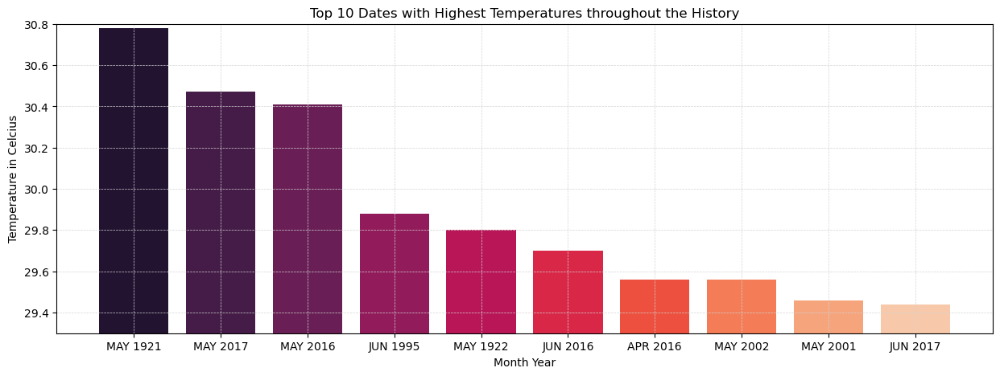

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
# Convert 'Date' to datetime and sort by 'Temperature'
df1['Date'] = pd.to_datetime(df1['Date'])
top_10 = df1.sort_values('Temprature', ascending=False).head(10)

# Create a new column 'Month_Year' for the x-axis labels
top_10['Month_Year'] = top_10['Month'] + ' ' + top_10['Year'].astype(str)

# Display the top 5 rows
print('Top 10 Dates with Highest Temperatures throughout the History')
print(top_10)

colours = sns.color_palette('rocket', 10)

# Plot the top 5 dates with highest temperatures
plt.figure(figsize=(15, 5))
plt.bar(top_10['Month_Year'], top_10['Temprature'], color=colours)
plt.xlabel('Month Year')
plt.ylabel('Temperature in Celcius')
plt.title('Top 10 Dates with Highest Temperatures throughout the History')
plt.ylim(29.30,30.8)
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

Top 10 Dates with Lowest Temperatures throughout the History
    Year Month  Temprature       Date Month_Year
17  1918   JAN       17.25 1918-01-01   JAN 1918
44  1945   JAN       17.33 1945-01-01   JAN 1945
4   1905   JAN       17.40 1905-01-01   JAN 1905
5   1906   JAN       17.50 1906-01-01   JAN 1906
67  1968   JAN       17.52 1968-01-01   JAN 1968
24  1925   JAN       17.53 1925-01-01   JAN 1925
34  1935   JAN       17.54 1935-01-01   JAN 1935
61  1962   JAN       17.54 1962-01-01   JAN 1962
62  1963   JAN       17.59 1963-01-01   JAN 1963
88  1989   JAN       17.68 1989-01-01   JAN 1989


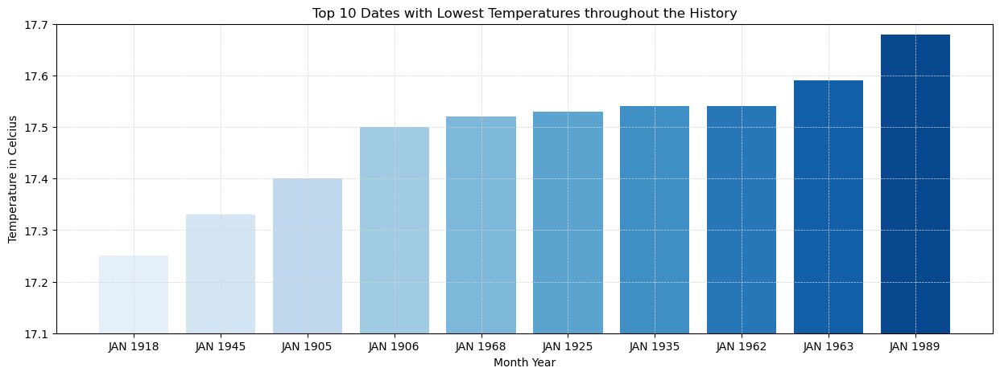

In [12]:
df1['Date'] = pd.to_datetime(df1['Date'])
top_10_ = df1.sort_values('Temprature', ascending=True).head(10)

# Create a new column 'Month_Year' for the x-axis labels
top_10_['Month_Year'] = top_10_['Month'] + ' ' + top_10_['Year'].astype(str)

# Display the top 5 rows
print('Top 10 Dates with Lowest Temperatures throughout the History')
print(top_10_)

colours = sns.color_palette("Blues", 10)

# Plot the top 5 dates with highest temperatures
plt.figure(figsize=(15, 5))
plt.bar(top_10_['Month_Year'], top_10_['Temprature'], color=colours)
plt.xlabel('Month Year')
plt.ylabel('Temperature in Celcius')
plt.title('Top 10 Dates with Lowest Temperatures throughout the History')
plt.ylim(17.10,17.70)
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

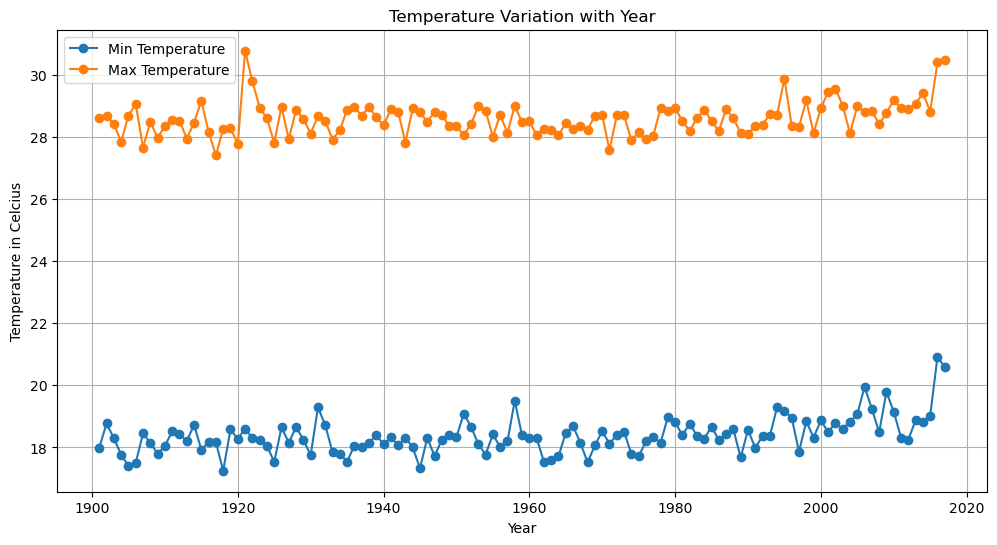

In [13]:

df1['Date'] = pd.to_datetime(df1['Date'])
df1['Year'] = df1['Date'].dt.year

# Group by year and calculate min and max temperature
df_grouped = df1.groupby('Year')['Temprature'].agg(['min', 'max'])

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_grouped.index, df_grouped['min'], label='Min Temperature', marker='o')
plt.plot(df_grouped.index, df_grouped['max'], label='Max Temperature', marker='o')
plt.xlabel('Year')
plt.ylabel('Temperature in Celcius')
plt.title('Temperature Variation with Year')
plt.legend()
plt.grid(True)
plt.show()

In [14]:
df['Avg_Temp'] = df.loc[:, 'JAN':'DEC'].mean(axis=1)

print(df)

     YEAR    JAN    FEB    MAR    APR    MAY    JUN    JUL    AUG    SEP  \
0    1901  17.99  19.43  23.49  26.41  28.28  28.60  27.49  26.98  26.26   
1    1902  19.00  20.39  24.10  26.54  28.68  28.44  27.29  27.05  25.95   
2    1903  18.32  19.79  22.46  26.03  27.93  28.41  28.04  26.63  26.34   
3    1904  17.77  19.39  22.95  26.73  27.83  27.85  26.84  26.73  25.84   
4    1905  17.40  17.79  21.78  24.84  28.32  28.69  27.67  27.47  26.29   
..    ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
112  2013  18.88  21.07  24.53  26.97  29.06  28.24  27.50  27.22  26.87   
113  2014  18.81  20.35  23.34  26.91  28.45  29.42  28.07  27.42  26.61   
114  2015  19.02  21.23  23.52  26.52  28.82  28.15  28.03  27.64  27.04   
115  2016  20.92  23.58  26.61  29.56  30.41  29.70  28.18  28.17  27.72   
116  2017  20.59  23.08  25.58  29.17  30.47  29.44  28.31  28.12  28.11   

       OCT    NOV    DEC   Avg_Temp  
0    25.08  21.73  18.95  24.224167  
1    24.37 

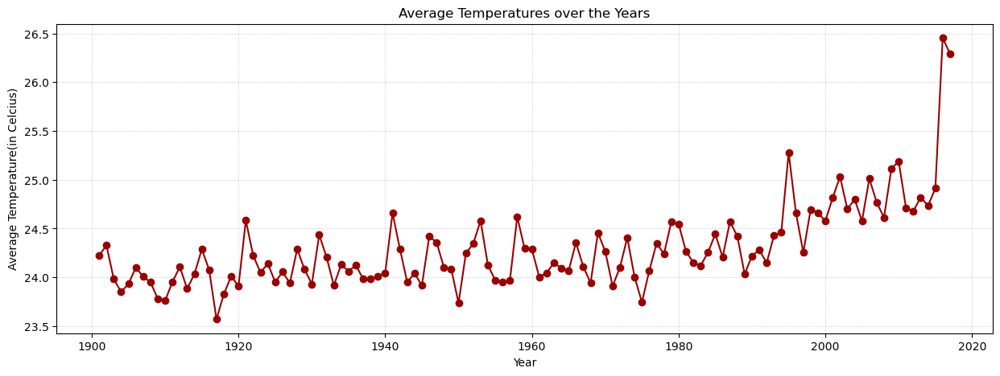

In [15]:
plt.figure(figsize=(15, 5))
plt.plot(df['YEAR'], df['Avg_Temp'], marker='o', color='#990000')
plt.xlabel('Year')
plt.ylabel('Average Temperature(in Celcius)')
plt.title('Average Temperatures over the Years')
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

In [16]:
fig = px.scatter(df,x = 'YEAR', y = 'Avg_Temp', trendline = 'lowess', color='Avg_Temp')
fig.update_layout(title='Trendline Over The Years :',
                 xaxis_title='Time', yaxis_title='Temprature in Degrees')
fig.show()

In [17]:
highest_avg= df.sort_values('Avg_Temp', ascending=False).head(10)
print('Top 10 Years with Highest Average Temperatures')
print(highest_avg)

Top 10 Years with Highest Average Temperatures
     YEAR    JAN    FEB    MAR    APR    MAY    JUN    JUL    AUG    SEP  \
115  2016  20.92  23.58  26.61  29.56  30.41  29.70  28.18  28.17  27.72   
116  2017  20.59  23.08  25.58  29.17  30.47  29.44  28.31  28.12  28.11   
94   1995  19.18  21.48  24.26  27.23  29.34  29.88  27.80  27.40  27.15   
109  2010  19.15  21.23  26.53  28.40  29.19  28.51  27.55  27.33  26.60   
108  2009  19.79  21.66  24.55  27.35  28.71  28.77  27.83  27.85  27.11   
101  2002  18.78  20.52  24.44  27.66  29.56  28.77  28.47  27.27  26.43   
105  2006  19.96  23.02  23.91  26.83  28.82  28.13  27.92  27.15  26.42   
114  2015  19.02  21.23  23.52  26.52  28.82  28.15  28.03  27.64  27.04   
112  2013  18.88  21.07  24.53  26.97  29.06  28.24  27.50  27.22  26.87   
100  2001  18.50  21.00  24.12  26.90  29.46  28.13  27.63  27.62  26.86   

       OCT    NOV    DEC   Avg_Temp  
115  26.81  23.90  21.89  26.454167  
116  27.24  23.92  21.47  26.291667  
94

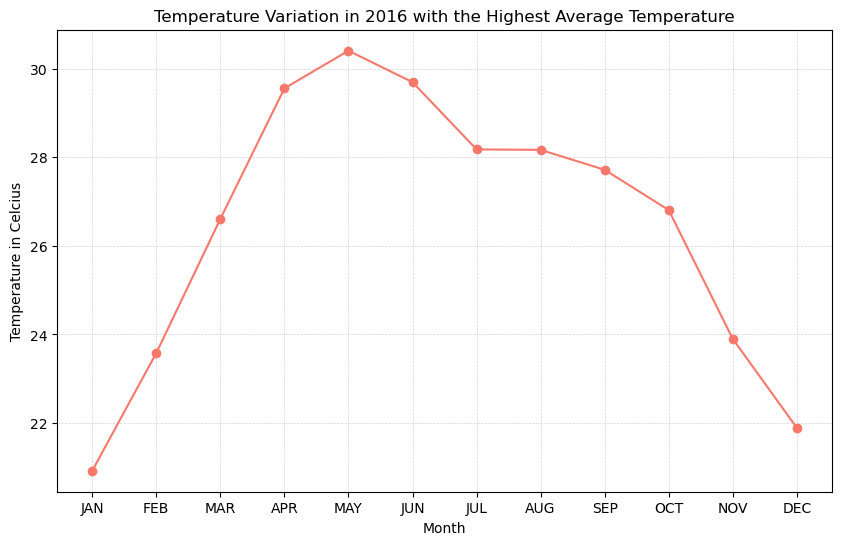

In [18]:
year = 2016
df_year = df[df['YEAR'] == year]

plt.figure(figsize=(10, 6))
plt.plot(df_year.columns[1:-1], df_year.loc[df_year.index[0], 'JAN':'DEC'], marker='o',color='#f7786b')
plt.xlabel('Month')
plt.ylabel('Temperature in Celcius')
plt.title(f'Temperature Variation in {year} with the Highest Average Temperature')
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

In [19]:
lowest_avg= df.sort_values('Avg_Temp', ascending=True).head(10)
print('Top 10 Years with Lowest Average Temperatures')
print(lowest_avg)

Top 10 Years with Lowest Average Temperatures
    YEAR    JAN    FEB    MAR    APR    MAY    JUN    JUL    AUG    SEP  \
16  1917  18.16  19.94  22.46  25.29  26.97  27.41  27.15  26.64  25.79   
49  1950  18.36  19.05  22.45  25.72  28.34  28.21  27.03  26.63  25.60   
74  1975  17.71  19.67  22.78  26.39  28.16  27.72  26.48  26.47  25.63   
9   1910  18.14  19.72  22.90  25.96  28.36  27.72  26.93  26.61  25.98   
8   1909  17.79  19.05  23.40  25.76  27.97  27.67  26.56  26.43  25.47   
17  1918  17.25  19.58  22.64  25.26  28.27  27.58  27.74  26.97  26.00   
3   1904  17.77  19.39  22.95  26.73  27.83  27.85  26.84  26.73  25.84   
12  1913  18.20  19.98  22.15  26.61  27.95  27.91  27.00  26.80  26.02   
19  1920  18.27  19.16  23.02  25.73  27.06  27.76  27.48  26.61  26.34   
70  1971  18.12  19.99  23.29  26.48  27.58  27.58  26.87  26.53  26.03   

      OCT    NOV    DEC   Avg_Temp  
16  23.85  20.80  18.39  23.570833  
49  24.07  21.03  18.33  23.735000  
74  24.65  20.76 

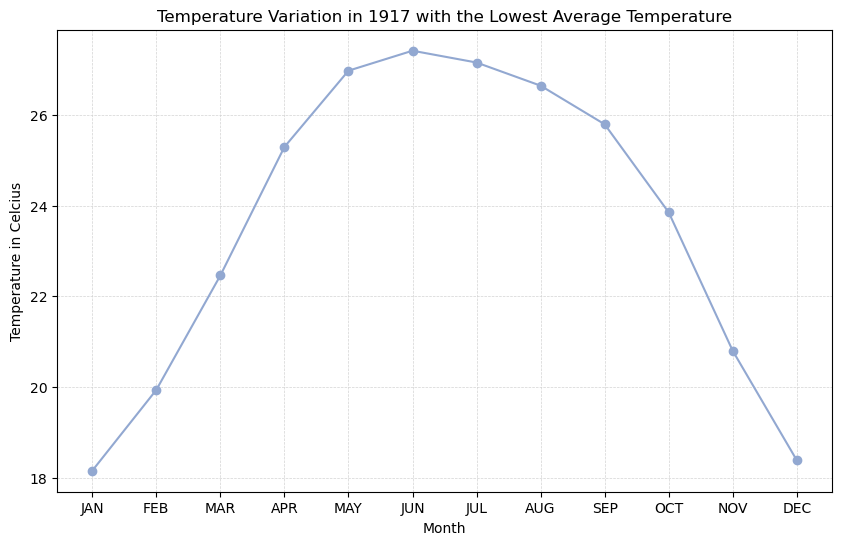

In [20]:
year = 1917
df_year = df[df['YEAR'] == year]

plt.figure(figsize=(10, 6))
plt.plot(df_year.columns[1:-1], df_year.loc[df_year.index[0], 'JAN':'DEC'], marker='o',color='#92a8d1')
plt.xlabel('Month')
plt.ylabel('Temperature in Celcius')
plt.title(f'Temperature Variation in {year} with the Lowest Average Temperature')
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

In [21]:
df['Winter'] = df[['DEC', 'JAN', 'FEB']].mean(axis=1)
df['Summer'] = df[['MAR', 'APR', 'MAY']].mean(axis=1)
df['Monsoon'] = df[['JUN', 'JUL', 'AUG', 'SEP']].mean(axis=1)
df['Autumn'] = df[['OCT', 'NOV']].mean(axis=1)
seasonal_df = df[['YEAR', 'Winter', 'Summer', 'Monsoon', 'Autumn']]
seasonal_df = pd.melt(seasonal_df, id_vars='YEAR', value_vars=seasonal_df.columns[1:])
seasonal_df.columns=['Year', 'Season', 'Temprature']
fig = px.scatter(seasonal_df, 'Year', 'Temprature', facet_col='Season', facet_col_wrap=2, trendline='ols',color='Temprature',color_continuous_scale=px.colors.sequential.Turbo)
fig.update_layout(title='Seasonal Mean Tempratures throught years')
fig.show()

C:\Users\Shruti Sawant\AppData\Local\Temp\ipykernel_12000\1588770792.py:21: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.



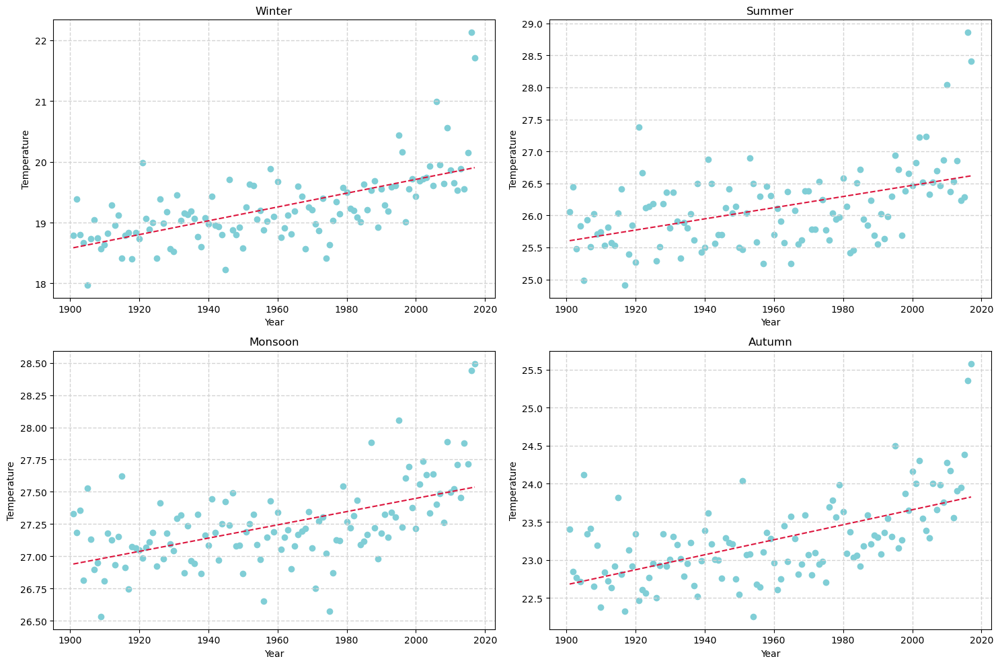

In [22]:
df['Winter'] = df[['DEC', 'JAN', 'FEB']].mean(axis=1)
df['Summer'] = df[['MAR', 'APR', 'MAY']].mean(axis=1)
df['Monsoon'] = df[['JUN', 'JUL', 'AUG', 'SEP']].mean(axis=1)
df['Autumn'] = df[['OCT', 'NOV']].mean(axis=1)
seasonal_df = df[['YEAR', 'Winter', 'Summer', 'Monsoon', 'Autumn']]
seasonal_df = pd.melt(seasonal_df, id_vars='YEAR', value_vars=seasonal_df.columns[1:])
seasonal_df.columns=['Year', 'Season', 'Temprature']
seasons = seasonal_df['Season'].unique()

fig, axs = plt.subplots(2, 2, figsize=(15, 10))  

axs = axs.ravel() 

for ax, season in zip(axs, seasons):
    df_season = seasonal_df[seasonal_df['Season'] == season]
    ax.scatter(df_season['Year'], df_season['Temprature'], color='#80ced6')
   
    z = np.polyfit(df_season['Year'], df_season['Temprature'], 1)
    p = np.poly1d(z)
    
    ax.plot(df_season['Year'], p(df_season['Year']), "r--",color='#dc143c')
    
    ax.set_title(season)
    ax.set_xlabel('Year')
    ax.set_ylabel('Temperature')
    ax.grid(color='lightgrey', linestyle='--', linewidth=1)

plt.tight_layout()

plt.show()

In [23]:
dfr = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\rainfall.csv")
dfr

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,ANDAMAN & NICOBAR ISLANDS,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,ANDAMAN & NICOBAR ISLANDS,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,ANDAMAN & NICOBAR ISLANDS,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,ANDAMAN & NICOBAR ISLANDS,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4111,LAKSHADWEEP,2011,5.1,2.8,3.1,85.9,107.2,153.6,350.2,254.0,255.2,117.4,184.3,14.9,1533.7,7.9,196.2,1013.0,316.6
4112,LAKSHADWEEP,2012,19.2,0.1,1.6,76.8,21.2,327.0,231.5,381.2,179.8,145.9,12.4,8.8,1405.5,19.3,99.6,1119.5,167.1
4113,LAKSHADWEEP,2013,26.2,34.4,37.5,5.3,88.3,426.2,296.4,154.4,180.0,72.8,78.1,26.7,1426.3,60.6,131.1,1057.0,177.6
4114,LAKSHADWEEP,2014,53.2,16.1,4.4,14.9,57.4,244.1,116.1,466.1,132.2,169.2,59.0,62.3,1395.0,69.3,76.7,958.5,290.5


In [24]:
missing_valuesr = dfr.isnull().sum()
print("Missing values in each column:\n", missing_valuesr)
duplicate_valuesr = dfr.duplicated().sum()
print("Number of duplicate rows: ", duplicate_valuesr)

Missing values in each column:
 SUBDIVISION     0
YEAR            0
JAN             4
FEB             3
MAR             6
APR             4
MAY             3
JUN             5
JUL             7
AUG             4
SEP             6
OCT             7
NOV            11
DEC            10
ANNUAL         26
Jan-Feb         6
Mar-May         9
Jun-Sep        10
Oct-Dec        13
dtype: int64
Number of duplicate rows:  0


In [25]:
columns = ['JAN', 'FEB', 'MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC','ANNUAL','Jan-Feb','Mar-May','Jun-Sep','Oct-Dec']

for column in columns:
    dfr[column].fillna(dfr[column].mean(), inplace=True)

In [26]:
df_melt = pd.melt(df, id_vars='YEAR', value_vars=df.columns[1:13], var_name='Month', value_name='Rainfall')


fig = px.scatter(df_melt, x='Month', y='Rainfall', animation_frame='YEAR', color='Rainfall',
                 range_y=[df_melt['Rainfall'].min(), df_melt['Rainfall'].max()], size='Rainfall',
                 color_continuous_scale=px.colors.sequential.Viridis_r)
fig.update_layout(title='Rainfall over the Years:',
                 xaxis_title='Year', yaxis_title='Rainfall')
fig.show()

In [27]:
dfr['AREA/YEAR'] = dfr['SUBDIVISION'] + ' ' + dfr['YEAR'].astype(str)
print(dfr)

                    SUBDIVISION  YEAR   JAN    FEB   MAR    APR    MAY    JUN  \
0     ANDAMAN & NICOBAR ISLANDS  1901  49.2   87.1  29.2    2.3  528.8  517.5   
1     ANDAMAN & NICOBAR ISLANDS  1902   0.0  159.8  12.2    0.0  446.1  537.1   
2     ANDAMAN & NICOBAR ISLANDS  1903  12.7  144.0   0.0    1.0  235.1  479.9   
3     ANDAMAN & NICOBAR ISLANDS  1904   9.4   14.7   0.0  202.4  304.5  495.1   
4     ANDAMAN & NICOBAR ISLANDS  1905   1.3    0.0   3.3   26.9  279.5  628.7   
...                         ...   ...   ...    ...   ...    ...    ...    ...   
4111                LAKSHADWEEP  2011   5.1    2.8   3.1   85.9  107.2  153.6   
4112                LAKSHADWEEP  2012  19.2    0.1   1.6   76.8   21.2  327.0   
4113                LAKSHADWEEP  2013  26.2   34.4  37.5    5.3   88.3  426.2   
4114                LAKSHADWEEP  2014  53.2   16.1   4.4   14.9   57.4  244.1   
4115                LAKSHADWEEP  2015   2.2    0.5   3.7   87.1  133.1  296.6   

        JUL    AUG    SEP  

In [28]:

lowest_annual= dfr.sort_values('ANNUAL', ascending=True).head(10)
print('Top 10 Dates with Lowest Annual Rainfall throughout the History')
print(lowest_annual)

Top 10 Dates with Lowest Annual Rainfall throughout the History
             SUBDIVISION  YEAR  JAN   FEB   MAR  APR   MAY   JUN   JUL   AUG  \
1834      WEST RAJASTHAN  1918  0.4   0.0   2.7  0.5   0.7   5.6   5.1  40.8   
1918      WEST RAJASTHAN  2002  0.3   2.6   1.0  1.4  11.2  26.9   2.4  17.2   
2478  SAURASHTRA & KUTCH  1987  0.0   0.0   0.4  0.0   0.1  31.4  18.4  33.5   
1821      WEST RAJASTHAN  1905  6.3   4.8   0.7  1.3   0.3   4.9  30.1   0.6   
2409  SAURASHTRA & KUTCH  1918  0.0   0.0   0.6  0.6   3.8   9.9  45.0  49.0   
1885      WEST RAJASTHAN  1969  1.0   1.2   1.1  1.0   2.7   3.0  48.8  43.5   
1855      WEST RAJASTHAN  1939  0.3  25.0   7.8  0.2   0.3  22.3  15.9  53.5   
1827      WEST RAJASTHAN  1911  2.8   0.3  37.3  1.9   0.1  26.0   3.2  14.8   
2402  SAURASHTRA & KUTCH  1911  1.5   0.0  35.5  0.0   0.5  42.1  12.6  27.4   
1884      WEST RAJASTHAN  1968  2.9   6.2   2.9  0.0   7.0   0.4  96.8  24.5   

       SEP  OCT  NOV  DEC  ANNUAL  Jan-Feb  Mar-May  Ju

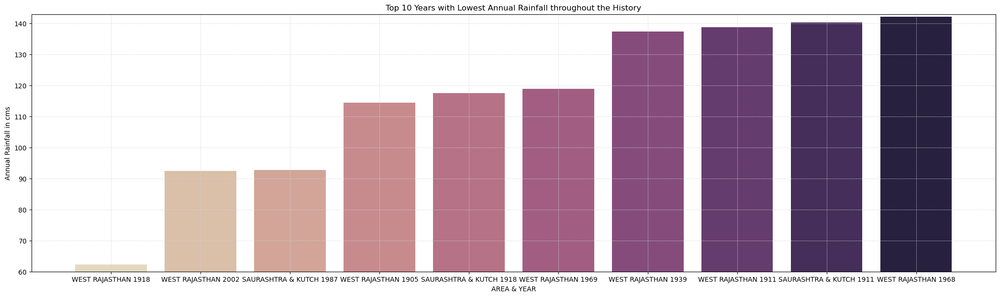

In [29]:

colours = sns.color_palette('ch:s=-.2,r=.6', 10)

# Plot the top 5 dates with highest temperatures
plt.figure(figsize=(26, 7))
plt.bar(lowest_annual['AREA/YEAR'], lowest_annual['ANNUAL'], color=colours)
plt.xlabel('AREA & YEAR')
plt.ylabel('Annual Rainfall in cms')
plt.title('Top 10 Years with Lowest Annual Rainfall throughout the History')
plt.ylim(60,143)
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

In [30]:

highest_annual= dfr.sort_values('ANNUAL', ascending=False).head(10)
print('Top 10 Dates with Highest Annual Rainfall throughout the History')
print(highest_annual)

Top 10 Dates with Highest Annual Rainfall throughout the History
            SUBDIVISION  YEAR    JAN    FEB    MAR    APR     MAY     JUN  \
142   ARUNACHAL PRADESH  1948   35.6  119.5  136.1  441.1  1168.6   889.5   
132   ARUNACHAL PRADESH  1938  144.8  121.6  340.5  395.3   306.5  1511.3   
115   ARUNACHAL PRADESH  1921   78.9   54.3  180.3  358.0   598.0  1233.2   
3602  COASTAL KARNATAKA  1961    0.0    0.0    0.9   47.7   635.0  1013.0   
112   ARUNACHAL PRADESH  1918   10.4   11.0  191.2  144.6   861.1  1609.9   
122   ARUNACHAL PRADESH  1928   48.9   39.7  118.2  123.4   431.9  1168.3   
121   ARUNACHAL PRADESH  1927   48.3  208.5   88.1  384.0   164.0  1045.4   
149   ARUNACHAL PRADESH  1958   98.4   67.5   32.9  138.5   698.6   511.2   
155   ARUNACHAL PRADESH  1964   55.4   90.3   81.1  219.7   286.4  1432.8   
143   ARUNACHAL PRADESH  1949   80.1   88.1  287.4  436.9   567.2   943.9   

         JUL     AUG     SEP    OCT   NOV   DEC  ANNUAL  Jan-Feb  Mar-May  \
142   2362

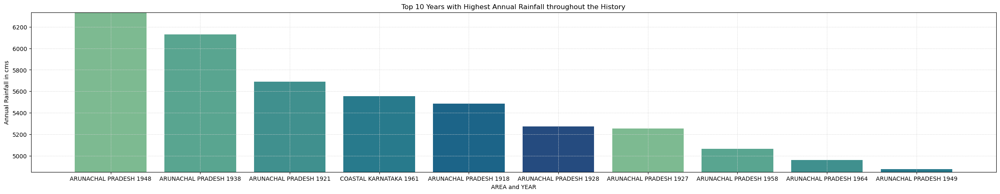

In [31]:
colours = sns.color_palette("crest")

plt.figure(figsize=(30, 5))
plt.bar(highest_annual['AREA/YEAR'], highest_annual['ANNUAL'], color=colours)
plt.xlabel('AREA and YEAR')
plt.ylabel('Annual Rainfall in cms')
plt.title('Top 10 Years with Highest Annual Rainfall throughout the History')
plt.ylim(4850,6335)
plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
plt.show()

In [32]:
dfr1 = pd.melt(dfr, id_vars='YEAR', value_vars=df.columns[2:13]) 
dfr1.head()

,YEAR,variable,value
0,1901,FEB,87.1
1,1902,FEB,159.8
2,1903,FEB,144.0
3,1904,FEB,14.7
4,1905,FEB,0.0


In [33]:
dfr1.columns=['YEAR','Month','Rainfall']
color_palette = px.colors.sequential.Blues_r

fig = px.box(dfr1, 'Month', 'Rainfall', color_discrete_sequence=color_palette)
fig.update_layout(title='Rainfall in different Months throughout the years', xaxis_title='Months', yaxis_title='Rainfall in cms')

fig.show()

In [34]:
months = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

# Create subplots
fig = make_subplots(rows=12, cols=1)

# Plot each month's rainfall over the years
for i, month in enumerate(months, start=1):
    fig.add_trace(
        go.Scatter(x=dfr['YEAR'], y=dfr[month], mode='markers',name=month),
        row=i,
        col=1
    )
    fig.update_yaxes(title_text=f'{month} Rainfall', row=i, col=1)

fig.update_layout(height=3000, width=800, title_text="Monthwise Rainfall Over the Years")
fig.show()

The subdivision with the maximum rainfall over the years is: COASTAL KARNATAKA


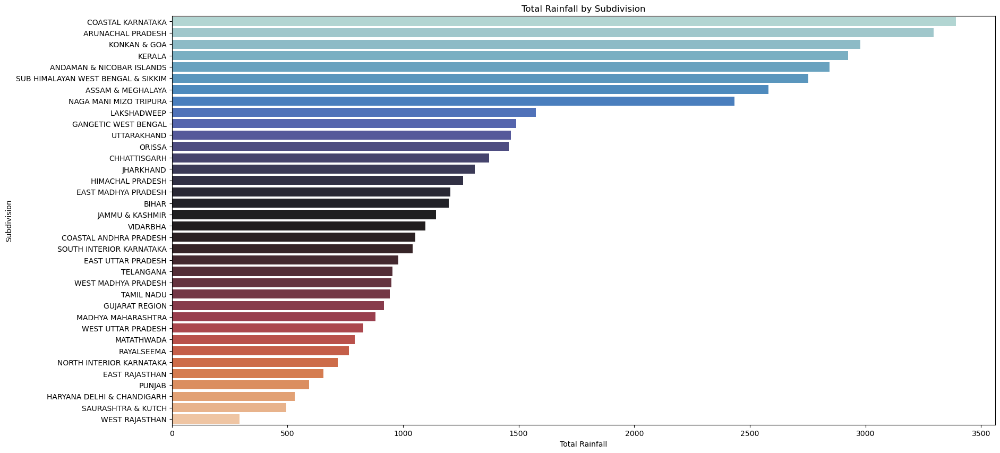

In [35]:
dfr_grouped = dfr.groupby('SUBDIVISION')['ANNUAL'].mean().reset_index()

max_rainfall_subdivision = dfr_grouped[dfr_grouped['ANNUAL'] == dfr_grouped['ANNUAL'].max()]

print(f"The subdivision with the maximum rainfall over the years is: {max_rainfall_subdivision['SUBDIVISION'].values[0]}")

plt.figure(figsize=(20, 10))
sns.barplot(x='ANNUAL', y='SUBDIVISION', data=dfr_grouped.sort_values('ANNUAL', ascending=False), palette='icefire')
plt.xlabel('Total Rainfall')
plt.ylabel('Subdivision')
plt.title('Total Rainfall by Subdivision')
plt.show()

In [36]:
t = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\temperatures.csv")
t
r = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\rainfall.csv")
r

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,ANDAMAN & NICOBAR ISLANDS,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,ANDAMAN & NICOBAR ISLANDS,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,ANDAMAN & NICOBAR ISLANDS,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,ANDAMAN & NICOBAR ISLANDS,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4111,LAKSHADWEEP,2011,5.1,2.8,3.1,85.9,107.2,153.6,350.2,254.0,255.2,117.4,184.3,14.9,1533.7,7.9,196.2,1013.0,316.6
4112,LAKSHADWEEP,2012,19.2,0.1,1.6,76.8,21.2,327.0,231.5,381.2,179.8,145.9,12.4,8.8,1405.5,19.3,99.6,1119.5,167.1
4113,LAKSHADWEEP,2013,26.2,34.4,37.5,5.3,88.3,426.2,296.4,154.4,180.0,72.8,78.1,26.7,1426.3,60.6,131.1,1057.0,177.6
4114,LAKSHADWEEP,2014,53.2,16.1,4.4,14.9,57.4,244.1,116.1,466.1,132.2,169.2,59.0,62.3,1395.0,69.3,76.7,958.5,290.5


In [37]:
t

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,JAN-FEB,MAR-MAY,JUN-SEP,OCT-DEC
0,1901,22.40,24.14,29.07,31.91,33.41,33.18,31.21,30.39,30.47,29.97,27.31,24.49,28.96,23.27,31.46,31.27,27.25
1,1902,24.93,26.58,29.77,31.78,33.73,32.91,30.92,30.73,29.80,29.12,26.31,24.04,29.22,25.75,31.76,31.09,26.49
2,1903,23.44,25.03,27.83,31.39,32.91,33.00,31.34,29.98,29.85,29.04,26.08,23.65,28.47,24.24,30.71,30.92,26.26
3,1904,22.50,24.73,28.21,32.02,32.64,32.07,30.36,30.09,30.04,29.20,26.36,23.63,28.49,23.62,30.95,30.66,26.40
4,1905,22.00,22.83,26.68,30.01,33.32,33.25,31.44,30.68,30.12,30.67,27.52,23.82,28.30,22.25,30.00,31.33,26.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,2013,24.56,26.59,30.62,32.66,34.46,32.44,31.07,30.76,31.04,30.27,27.83,25.37,29.81,25.58,32.58,31.33,27.83
113,2014,23.83,25.97,28.95,32.74,33.77,34.15,31.85,31.32,30.68,30.29,28.05,25.08,29.72,24.90,31.82,32.00,27.81
114,2015,24.58,26.89,29.07,31.87,34.09,32.48,31.88,31.52,31.55,31.04,28.10,25.67,29.90,25.74,31.68,31.87,28.27
115,2016,26.94,29.72,32.62,35.38,35.72,34.03,31.64,31.79,31.66,31.98,30.11,28.01,31.63,28.33,34.57,32.28,30.03


In [38]:
r_melt = r.melt(id_vars=['YEAR', 'SUBDIVISION'], value_vars=['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC'], var_name='MONTH', value_name='RAINFALL')
t_melt = t.melt(id_vars=['YEAR'], value_vars=['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC'], var_name='MONTH', value_name='TEMPERATURE')

# Merge the two datasets
merged = pd.merge(r_melt, t_melt,  how='left', left_on=['YEAR','MONTH'], right_on = ['YEAR','MONTH'])

# Create the plot
fig = px.scatter(merged, x='TEMPERATURE', y='RAINFALL', color="RAINFALL",
                 labels={'x':'Temperature (°C)', 'y':'Rainfall (mm)'},
                 title='Effect of Temperature on Rainfall over the Years',color_continuous_scale=px.colors.sequential.Turbo)
fig.show()

In [39]:
fig = px.scatter(merged, x='RAINFALL', y='TEMPERATURE',color="TEMPERATURE",
                 labels={'x':'Rainfall (mm)', 'y':'Temperature (°C)'},
                 title='Effect of Rainfall on Temperature over the Years',color_continuous_scale=px.colors.sequential.Sunsetdark)
fig.show()

In [40]:
r['AVG_RAINFALL'] = r[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].mean(axis=1)
t['AVG_TEMPERATURE'] = t[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].mean(axis=1)

# Merge the two datasets
merged_avg = pd.merge(r[['YEAR', 'SUBDIVISION', 'AVG_RAINFALL']], t[['YEAR', 'AVG_TEMPERATURE']],  how='left', on=['YEAR'])

# Create the plot
fig = px.scatter(merged_avg, x='AVG_TEMPERATURE', y='AVG_RAINFALL',color="AVG_RAINFALL",
                 labels={'x':'Average Temperature (°C)', 'y':'Average Rainfall (mm)'},
                 title='Effect of Average Temperature on Average Rainfall over the Years',color_continuous_scale= px.colors.sequential.Blugrn)
fig.show()

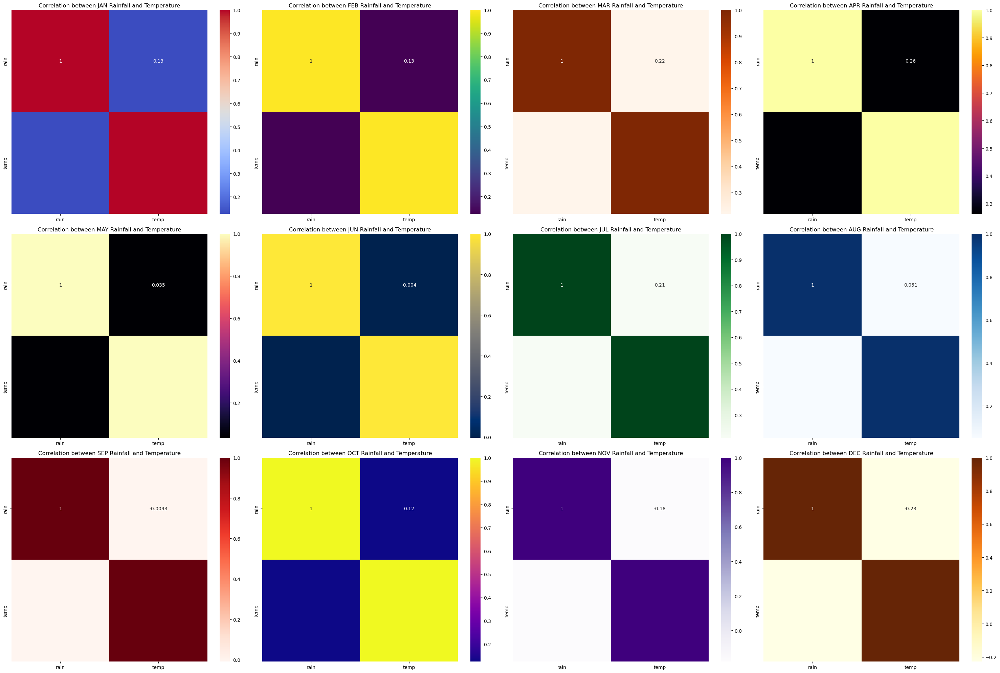

In [41]:

# Assuming 'r' is your rainfall dataset and 't' is your temperature dataset
months = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

# List of colormaps
colormaps = ['coolwarm', 'viridis', 'Oranges', 'inferno', 'magma', 'cividis', 'Greens', 'Blues', 'Reds', 'plasma', 'Purples', 'YlOrBr']

fig, axs = plt.subplots(3, 4, figsize=(30, 20))

for i, month in enumerate(months):
    # Calculate the correlation
    correlation = pd.DataFrame({'rain': r[month], 'temp': t[month]}).corr()

    # Create a heatmap with a different colormap for each month
    sns.heatmap(correlation, annot=True, cmap=colormaps[i%12], ax=axs[i//4, i%4])
    axs[i//4, i%4].set_title(f'Correlation between {month} Rainfall and Temperature')

plt.tight_layout()
plt.show()


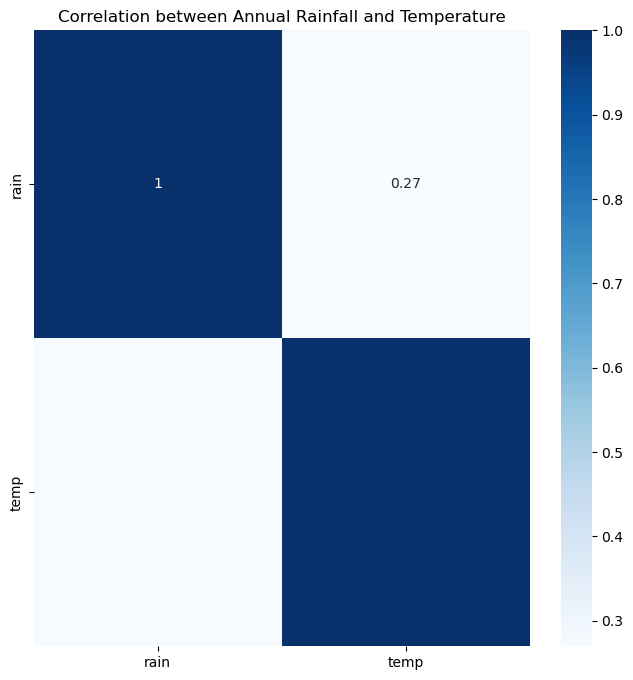

In [42]:

# Calculate the correlation
correlation = pd.DataFrame({'rain': r['ANNUAL'], 'temp': t['ANNUAL']}).corr()

# Create a heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(correlation, annot=True, cmap='Blues')
plt.title('Correlation between Annual Rainfall and Temperature')
plt.show()


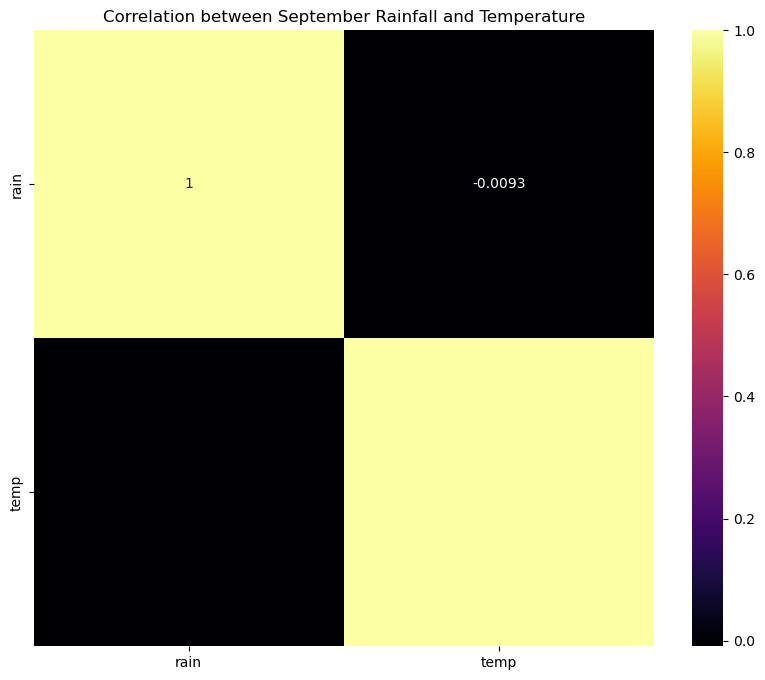

In [43]:

correlation = pd.DataFrame({'rain': r['SEP'], 'temp': t['SEP']}).corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='inferno')
plt.title('Correlation between September Rainfall and Temperature')
plt.show()


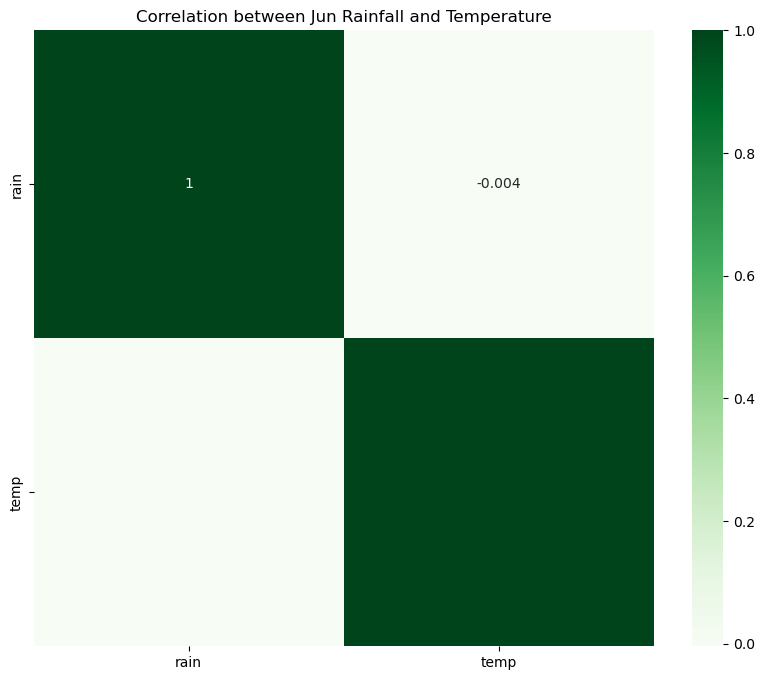

In [44]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation
correlation = pd.DataFrame({'rain': r['JUN'], 'temp': t['JUN']}).corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='Greens')
plt.title('Correlation between Jun Rainfall and Temperature')
plt.show()


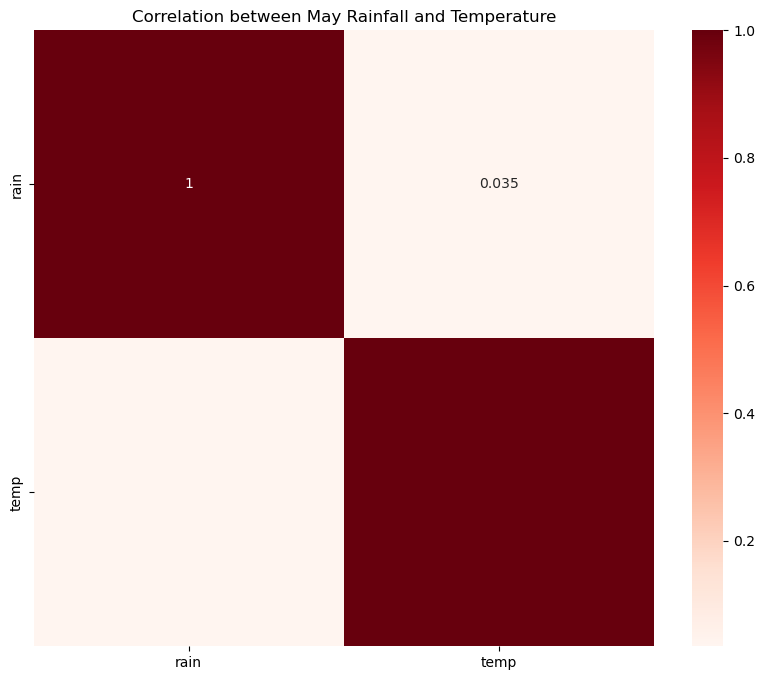

In [45]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation
correlation = pd.DataFrame({'rain': r['MAY'], 'temp': t['MAY']}).corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='Reds')
plt.title('Correlation between May Rainfall and Temperature')
plt.show()


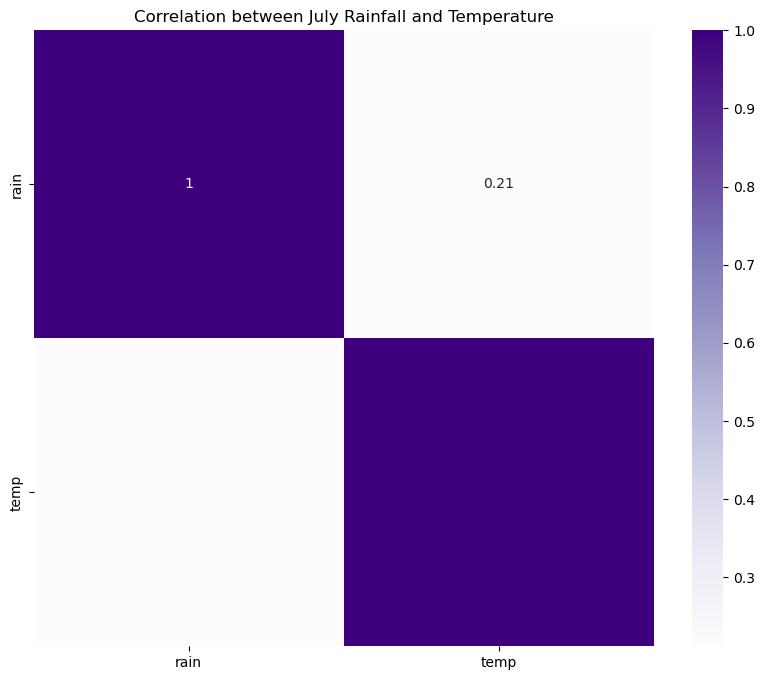

In [46]:
correlation = pd.DataFrame({'rain': r['JUL'], 'temp': t['JUL']}).corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='Purples')
plt.title('Correlation between July Rainfall and Temperature')
plt.show()

In [47]:
!pip install scikit-learn tensorflow


Defaulting to user installation because normal site-packages is not writeable


In [48]:
# Importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer

In [49]:
# Assuming that the datasets are already loaded and named as t and r
te = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\temperatures.csv")
te
ra = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\rainfall.csv")
ra
# Merge the datasets on 'YEAR' column
dfrt = pd.merge(te, ra, on='YEAR')

dfrt


,YEAR,JAN_x,FEB_x,MAR_x,APR_x,MAY_x,JUN_x,JUL_x,AUG_x,SEP_x,...,AUG_y,SEP_y,OCT_y,NOV_y,DEC_y,ANNUAL_y,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,1901,22.40,24.14,29.07,31.91,33.41,33.18,31.21,30.39,30.47,...,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,1901,22.40,24.14,29.07,31.91,33.41,33.18,31.21,30.39,30.47,...,464.1,291.4,163.7,115.6,1.2,2498.6,46.6,460.5,1710.9,280.5
2,1901,22.40,24.14,29.07,31.91,33.41,33.18,31.21,30.39,30.47,...,466.0,304.1,166.7,67.4,0.0,2168.4,29.8,359.6,1544.8,234.2
3,1901,22.40,24.14,29.07,31.91,33.41,33.18,31.21,30.39,30.47,...,501.1,242.7,55.5,17.9,2.6,2113.2,41.3,238.9,1757.0,76.1
4,1901,22.40,24.14,29.07,31.91,33.41,33.18,31.21,30.39,30.47,...,275.7,313.5,51.1,83.4,0.0,1487.6,95.5,189.7,1068.0,134.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4111,2015,24.58,26.89,29.07,31.87,34.09,32.48,31.88,31.52,31.55,...,575.2,260.3,208.5,124.2,14.3,3106.0,2.4,254.8,2501.8,347.1
4112,2015,24.58,26.89,29.07,31.87,34.09,32.48,31.88,31.52,31.55,...,78.4,150.8,61.2,5.7,1.7,551.9,2.4,123.6,357.2,68.6
4113,2015,24.58,26.89,29.07,31.87,34.09,32.48,31.88,31.52,31.55,...,136.6,164.5,106.1,138.1,4.4,1112.5,1.9,230.2,631.8,248.6
4114,2015,24.58,26.89,29.07,31.87,34.09,32.48,31.88,31.52,31.55,...,252.2,292.9,308.1,223.6,79.4,2600.6,8.9,465.9,1514.7,611.1


In [50]:
print(dfrt[['ANNUAL_x', 'ANNUAL_y']])


      ANNUAL_x  ANNUAL_y
0        28.96    3373.2
1        28.96    2498.6
2        28.96    2168.4
3        28.96    2113.2
4        28.96    1487.6
...        ...       ...
4111     29.90    3106.0
4112     29.90     551.9
4113     29.90    1112.5
4114     29.90    2600.6
4115     29.90    1642.9

[4116 rows x 2 columns]


In [51]:
X = dfrt.loc[:, 'JAN_x':'DEC_x']

# Selecting the columns from 'JAN_y' through 'DEC_y' as the target
y = dfrt.loc[:, 'JAN_y':'DEC_y']
imputer = SimpleImputer(strategy='mean')

# Fit the imputer and transform y
y = imputer.fit_transform(y)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Building the ANN model
model = Sequential()
model.add(Dense(X.shape[1], input_dim=X.shape[1], activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(12, activation='linear'))  # We have multiple target variables

# Compiling the model
model.compile(loss='mean_squared_error', optimizer='adam')

# Training the model
model.fit(X_train, y_train, epochs=50, batch_size=10, verbose=0)

# Making predictions
predictions = model.predict(X_test)

# Printing the first 5 predictions
print(predictions[:5])
mse12 = mean_squared_error(y_test, predictions)
print("Mean Squared Error: ", mse12)


C:\Users\Shruti Sawant\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:86: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
[[ 18.504068  23.192358  27.675665  44.73234   89.80337  238.88875
  362.09457  301.91614  204.70619   99.14604   40.902523  19.167524]
 [ 19.148182  24.152437  28.824299  46.47164   93.42004  247.84232
  376.0313   313.66934  212.2376   102.84187   42.346565  19.636768]
 [ 18.016233  22.312557  26.697765  43.219357  86.56608  230.8261
  349.5239   291.4679   197.61241   95.81136   39.639244  18.703064]
 [ 18.858006  23.57694   28.342302  45.55144   91.51783  242.97694
  368.56165  307.43344  208.30447  100.84818   41.524372  19.386864]
 [ 17.720858  21.246107  25.349163  41.71888   82.90263  223.66103
  337.22357  281.0437   190.84264   92.81802   38.85096   18.84068 ]]
Mean Squared Error:  17361.067021891246


In [52]:
# Importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer

# Assuming that the datasets are already loaded and named as dfrt

# Selecting the columns from 'JAN_x' through 'DEC_x' as features
X = dfrt.loc[:, 'JAN_x':'DEC_x']

# Selecting the columns from 'JAN_y' through 'DEC_y' as the target
y = dfrt.loc[:, 'JAN_y':'DEC_y']

# Create a SimpleImputer object with strategy set to 'mean'
imputer = SimpleImputer(strategy='mean')

# Fit the imputer and transform y
y = imputer.fit_transform(y)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=72)

# Scaling the features
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Building the Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=72)

# Training the model
model.fit(X_train, y_train)

# Making predictions
predictions = model.predict(X_test)

# Printing the first 5 predictions
print(predictions[:5])


[[ 11.99451431  17.6057206   25.31392687  43.8572308   73.97153231
  207.54368618 258.57313288 311.28770212 177.63648053 119.90748439
   57.5093837   38.66812751]
 [  5.74740204  55.05439023  16.38009056  57.6019209   93.54026187
  269.18122331 437.92863205 288.63665356 216.95739494 139.40167655
   28.08971119  46.97198621]
 [ 14.27585969  22.19700403  15.67432802  45.71664533  90.87842709
  176.36932982 327.84907255 325.60834416 224.35349363  87.07442942
   18.28360858  28.26553966]
 [ 33.04609238  22.0353957   28.58235353  33.19114336  60.27032094
  230.61081313 415.78508215 258.00120576 154.5555729   82.80564787
   23.55001243  14.49853969]
 [ 17.96872229  23.1438936   26.07807405  49.46693867  64.61025319
  263.34148335 411.92466354 308.64874012 165.59107215 111.5836428
   42.24419023  11.72278087]]


In [53]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error: ", mse)

Mean Squared Error:  18790.834136470683


In [54]:
# Importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor

# Assuming that the datasets are already loaded and named as dfrt

# Selecting the columns from 'JAN_x' through 'DEC_x' as features
X = dfrt.loc[:, 'JAN_x':'DEC_x']

# Selecting the columns from 'JAN_y' through 'DEC_y' as the target
y = dfrt.loc[:, 'JAN_y':'DEC_y']
imputer = SimpleImputer(strategy='mean')

# Fit the imputer and transform y
y = imputer.fit_transform(y)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Building the SVR model
model = MultiOutputRegressor(SVR(kernel='rbf'))

# Training the model
model.fit(X_train, y_train)

# Making predictions
predictions = model.predict(X_test)

# Printing the first 5 predictions
print(predictions[:5])
mse2 = mean_squared_error(y_test, predictions)
print("Mean Squared Error: ", mse2)


[[  7.91636727   8.20042297   8.97534066   6.49858041  34.9146794
  142.24113006 294.1523968  268.3574295  193.28995764  71.19073961
    8.69110761   0.39990634]
 [ 10.69175625   5.57914      5.79993225  11.9923861   36.38921578
  114.47755116 288.53621182 263.16585277 198.26110098  62.31238876
   10.45079953   5.40003566]
 [  4.57199104   2.96523792   5.62559266  14.69439985  37.79921491
  133.33335754 285.64490301 262.17439917 177.91796482  64.81104175
   11.97620458   7.39802779]
 [ 16.19963475   4.49993572   2.57847948  15.85773517  27.88637085
  136.27998762 286.25929135 258.04859133 196.81478252  65.9520375
    9.49859454   7.2288426 ]
 [  7.78810511   6.49996358   6.89992089  13.1000298   35.47179781
  138.99951058 259.87521575 255.66420359 163.4002398   60.72086487
    5.89822582   2.2214215 ]]
Mean Squared Error:  18762.379955559463


In [55]:
w = pd.read_csv(r"C:\Users\Shruti Sawant\OneDrive\Desktop\Weatherr Analysis\weather.csv")
w


,country,location_name,region,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,1693286100,29-08-2023 10:45,27.5,81.5,...,12.6,18.5,1,2,5:59 AM,6:41 PM,5:42 PM,3:38 AM,Waxing Gibbous,93
1,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,1693286100,29-08-2023 10:45,27.5,81.5,...,10.7,14.2,1,1,6:00 AM,6:40 PM,5:39 PM,3:41 AM,Waxing Gibbous,93
2,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,1693286100,29-08-2023 10:45,26.3,79.3,...,16.8,20.7,2,2,5:56 AM,6:34 PM,5:32 PM,3:39 AM,Waxing Gibbous,93
3,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,1693286100,29-08-2023 10:45,25.6,78.1,...,4.9,6.6,1,1,6:00 AM,6:38 PM,5:36 PM,3:43 AM,Waxing Gibbous,93
4,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,1693286100,29-08-2023 10:45,27.2,81.0,...,11.4,14.8,1,1,6:01 AM,6:39 PM,5:38 PM,3:42 AM,Waxing Gibbous,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35009,India,Niwari,Uttar Pradesh,28.88,77.53,Asia/Kolkata,1698785100,01-11-2023 02:15,21.0,69.8,...,201.2,274.8,5,10,6:31 AM,5:36 PM,7:22 PM,9:00 AM,Waning Gibbous,94
35010,India,Saitual,Mizoram,23.97,92.58,Asia/Kolkata,1698785100,01-11-2023 02:15,20.0,68.0,...,18.0,21.8,2,2,5:25 AM,4:41 PM,6:33 PM,7:45 AM,Waning Gibbous,94
35011,India,Ranipet,Tamil Nadu,12.93,79.33,Asia/Kolkata,1698785100,01-11-2023 02:15,23.0,73.5,...,12.2,19.7,1,2,6:06 AM,5:47 PM,7:53 PM,8:16 AM,Waning Gibbous,94
35012,India,Tenkasi,Tamil Nadu,8.97,77.30,Asia/Kolkata,1698785100,01-11-2023 02:15,21.9,71.5,...,26.7,27.9,2,3,6:10 AM,5:59 PM,8:10 PM,8:16 AM,Waning Gibbous,94


In [56]:
print(w.columns)

Index(['country', 'location_name', 'region', 'latitude', 'longitude',
       'timezone', 'last_updated_epoch', 'last_updated', 'temperature_celsius',
       'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in',
       'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'feels_like_fahrenheit', 'visibility_km', 'visibility_miles',
       'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
       'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise',
       'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')


In [57]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
le = LabelEncoder()
w['location_name'] = le.fit_transform(w['location_name'])

# Select the features and target
features = w[['location_name', 'air_quality_PM2.5', 'air_quality_PM10', 'pressure_mb', 'gust_kph', 'feels_like_celsius', 'cloud', 'precip_mm', 'wind_kph', 'humidity']]
target = w['temperature_celsius']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Scale the feature data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define the model
model = Sequential()
model.add(Dense(32, input_dim=X_train.shape[1], activation='relu'))  # Input layer
model.add(Dense(64, activation='relu'))  # Hidden layer
model.add(Dense(1))  # Output layer

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32)
predictions_ann = model.predict(X_test)


Epoch 1/100


C:\Users\Shruti Sawant\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:86: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 164.2669
Epoch 2/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 3.7094
Epoch 3/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.7523
Epoch 4/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.3637
Epoch 5/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.2729
Epoch 6/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.2447
Epoch 7/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.2256
Epoch 8/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.2116
Epoch 9/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.2018
Epoch 10/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.1618
Epoch 11/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.1228
Epoch 12/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.1089
Epoch 13/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.1020
Epoch 14/100
876/876 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.1041
Epoch 15/100
876/876 ━━━━

In [58]:
print('X values:',X_test[:1])
print('First 10 actual values:',y_test[:10])
print('First 10 predictions:', predictions_ann[:10])


X values: [[ 1.67056733 -0.66913471 -0.68738988 -0.50119799 -1.08908325  0.61322287
   1.0901607   1.53201529 -0.92715071  0.39066581]]
First 10 actual values: 13101    25.8
15973    25.4
33565    19.3
29101    21.0
28575    21.0
32656    22.3
7751     25.3
22073    23.5
1288     24.9
7845     26.9
Name: temperature_celsius, dtype: float64
First 10 predictions: [[25.460249]
 [25.2605  ]
 [19.258776]
 [20.952105]
 [21.006714]
 [22.321789]
 [25.08841 ]
 [23.369175]
 [24.87072 ]
 [26.568462]]


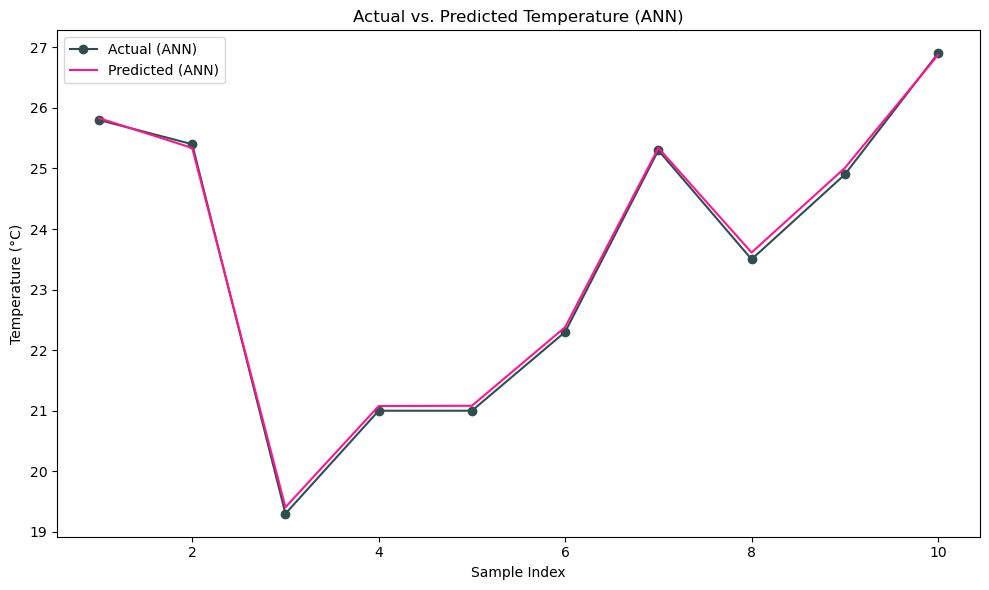

In [77]:
import matplotlib.pyplot as plt

# Subset the data for the first 10 data points
actual_values = [25.8, 25.4, 19.3, 21.0, 21.0, 22.3, 25.3, 23.5, 24.9, 26.9]
predicted_values = [25.830772, 25.337713, 19.406681, 21.077066, 21.082016, 22.37981, 25.338564, 23.611876, 25.007696, 26.872992]

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot actual values
ax.plot(range(1, 11), actual_values, label='Actual (ANN)', marker='o', linestyle='-', color='darkslategray')

# Plot predicted values
ax.plot(range(1, 11), predicted_values, label='Predicted (ANN)', linestyle='-', color='deeppink')

# Customize the plot
ax.set_xlabel('Sample Index')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Actual vs. Predicted Temperature (ANN)')
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [60]:
mse = mean_squared_error(y_test, predictions_ann)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.06369679656448367


In [61]:


# Split the data into training and test sets
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(features, target, test_size=0.2, random_state=42)

# Scale the feature data
scaler = StandardScaler()
X_train_rf = scaler.fit_transform(X_train_rf)
X_test_rf = scaler.transform(X_test_rf)

# Define the model
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train_rf, y_train_rf)

# Use the model to make predictions
predictions_rf = model.predict(X_test_rf)

# Calculate and print the MSE
mse = mean_squared_error(y_test_rf, predictions_rf)
print(f'Mean Squared Error: {mse}')

# Print the first 5 predictions
print('First 10 actual values:',y_test_rf[:10])
print('First 10 predictions:', predictions_rf[:10])

Mean Squared Error: 0.03087739340282734
First 10 actual values: 13101    25.8
15973    25.4
33565    19.3
29101    21.0
28575    21.0
32656    22.3
7751     25.3
22073    23.5
1288     24.9
7845     26.9
Name: temperature_celsius, dtype: float64
First 10 predictions: [25.925 25.383 19.3   21.    21.    22.395 25.279 23.502 25.119 26.876]


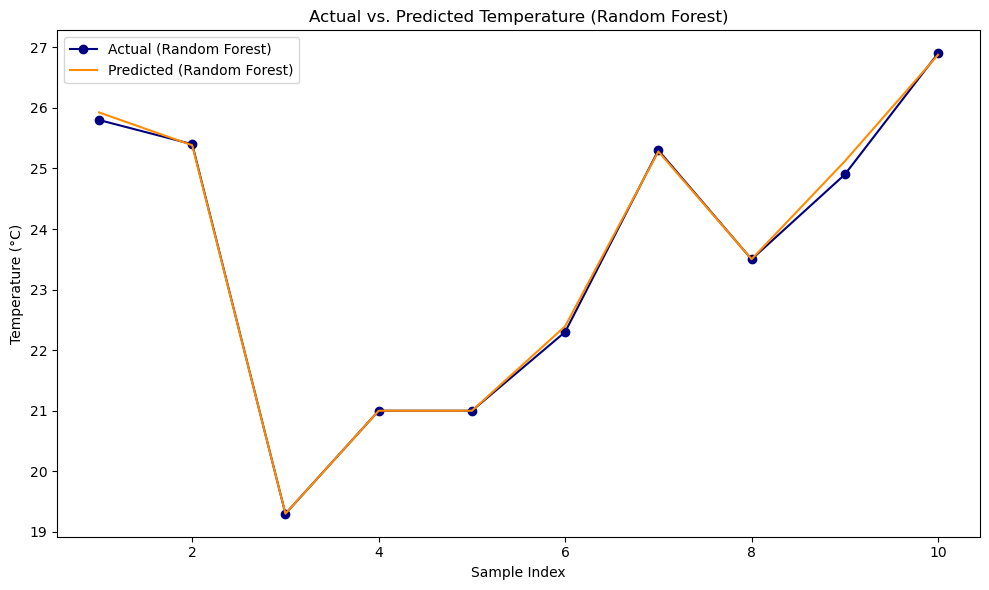

In [80]:


# Subset the data for the first 10 data points
actual_values = [25.8, 25.4, 19.3, 21.0, 21.0, 22.3, 25.3, 23.5, 24.9, 26.9]
predicted_values = [25.925, 25.383, 19.3, 21.0, 21.0, 22.395, 25.279, 23.502, 25.119, 26.876]

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot actual values
ax.plot(range(1, 11), actual_values, label='Actual (Random Forest)', marker='o', linestyle='-', color='navy')

# Plot predicted values
ax.plot(range(1, 11), predicted_values, label='Predicted (Random Forest)', linestyle='-', color='darkorange')

# Customize the plot
ax.set_xlabel('Sample Index')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Actual vs. Predicted Temperature (Random Forest)')
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [73]:
X_train_svr, X_test_svr, y_train_svr, y_test_svr = train_test_split(features, target, test_size=0.2, random_state=42)

# Scale the feature data
scaler = StandardScaler()
X_train_svr = scaler.fit_transform(X_train_svr)
X_test_svr = scaler.transform(X_test_svr)
# Define the model
model = SVR(kernel='rbf')

# Train the model
model.fit(X_train_svr, y_train_svr)

# Use the model to make predictions
predictions_svr = model.predict(X_test_svr)

# Calculate and print the MSE
mse = mean_squared_error(y_test_svr, predictions_svr)
print(f'Mean Squared Error: {mse}')

# Print the first 5 predictions
print('First 10 actual values:',y_test_svr[:10])
print('First 10 predictions:', predictions_svr[:10])


Mean Squared Error: 0.34723906016935174
First 10 actual values: 13101    25.8
15973    25.4
33565    19.3
29101    21.0
28575    21.0
32656    22.3
7751     25.3
22073    23.5
1288     24.9
7845     26.9
Name: temperature_celsius, dtype: float64
First 10 predictions: [25.66860036 25.2847764  19.28339805 20.8168155  20.74142314 23.27356294
 25.14715163 23.58901101 24.83128411 26.9479278 ]


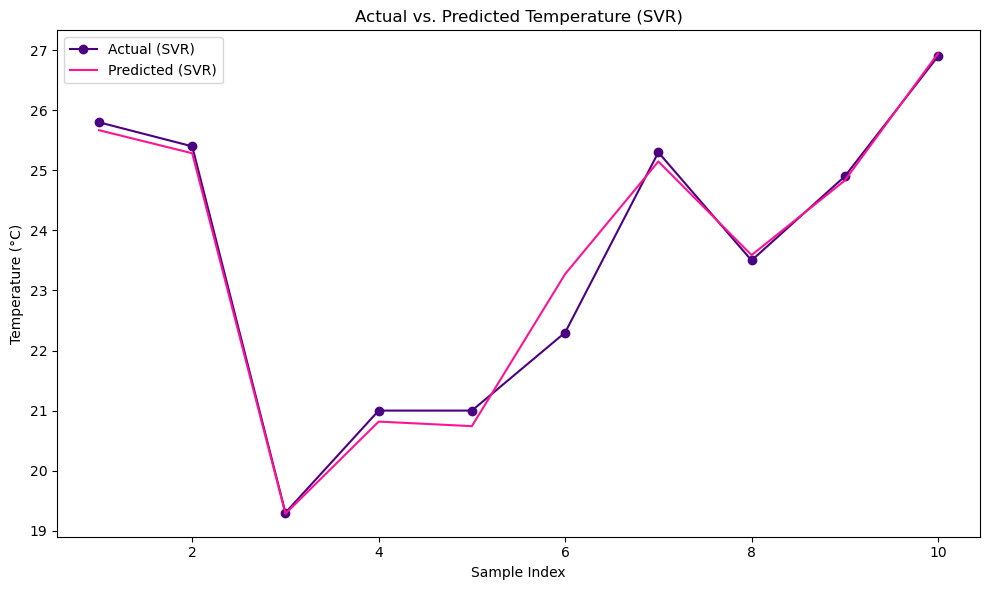

In [81]:

# Subset the data for the first 10 data points
actual_values = [25.8, 25.4, 19.3, 21.0, 21.0, 22.3, 25.3, 23.5, 24.9, 26.9]
predicted_values = [25.66860036, 25.2847764, 19.28339805, 20.8168155, 20.74142314, 23.27356294, 25.14715163, 23.58901101, 24.83128411, 26.9479278]

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot actual values
ax.plot(range(1, 11), actual_values, label='Actual (SVR)', marker='o', linestyle='-', color='indigo')

# Plot predicted values
ax.plot(range(1, 11), predicted_values, label='Predicted (SVR)', linestyle='-', color='deeppink')

# Customize the plot
ax.set_xlabel('Sample Index')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Actual vs. Predicted Temperature (SVR)')
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [74]:
from sklearn.linear_model import LinearRegression
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(features, target, test_size=0.2, random_state=42)

# Scale the feature data
scaler = StandardScaler()
X_train_lr = scaler.fit_transform(X_train_lr)
X_test_lr = scaler.transform(X_test_lr)
# Define the model
model = LinearRegression()

# Train the model
model.fit(X_train_lr, y_train_lr)

# Use the model to make predictions
predictions_lr = model.predict(X_test_lr)

# Calculate and print the MSE
mse = mean_squared_error(y_test_lr, predictions_lr)
print(f'Mean Squared Error: {mse}')

# Print the first 5 predictions
print('First 10 actual values:',y_test_lr[:10])
print('First 10 predictions:', predictions_lr[:10])

Mean Squared Error: 0.586398791983734
First 10 actual values: 13101    25.8
15973    25.4
33565    19.3
29101    21.0
28575    21.0
32656    22.3
7751     25.3
22073    23.5
1288     24.9
7845     26.9
Name: temperature_celsius, dtype: float64
First 10 predictions: [25.74583969 25.7012626  18.44816262 19.81796047 20.17303682 22.94425726
 25.4842536  23.58075583 25.13155497 27.49822996]


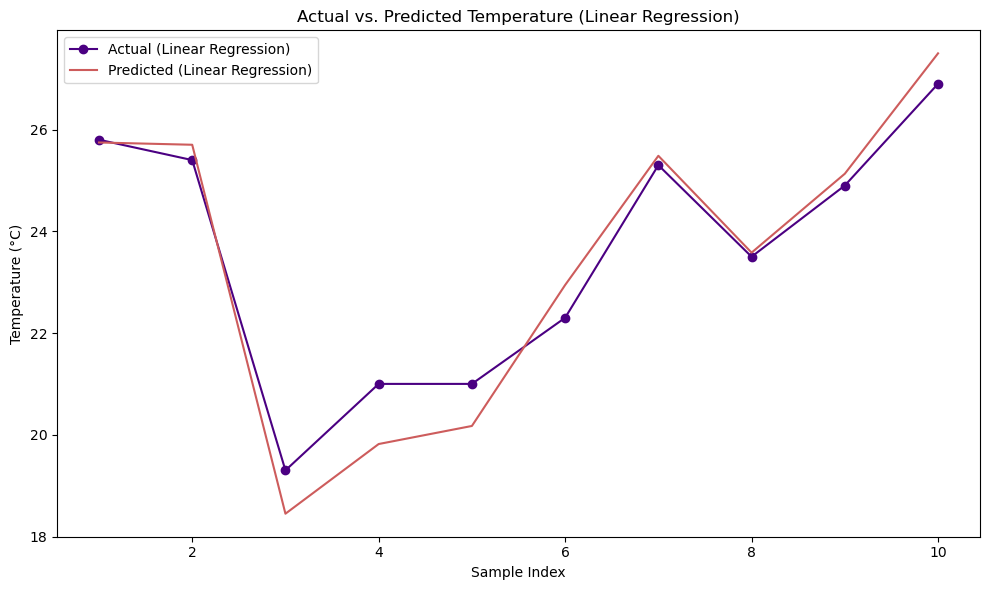

In [83]:

# Subset the data for the first 10 data points
actual_values = [25.8, 25.4, 19.3, 21.0, 21.0, 22.3, 25.3, 23.5, 24.9, 26.9]
predicted_values = [25.74583969, 25.7012626, 18.44816262, 19.81796047, 20.17303682, 22.94425726, 25.4842536, 23.58075583, 25.13155497, 27.49822996]

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot actual values
ax.plot(range(1, 11), actual_values, label='Actual (Linear Regression)', marker='o', linestyle='-', color='indigo')

# Plot predicted values
ax.plot(range(1, 11), predicted_values, label='Predicted (Linear Regression)', linestyle='-', color='indianred')

# Customize the plot
ax.set_xlabel('Sample Index')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Actual vs. Predicted Temperature (Linear Regression)')
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [65]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt

# Define a function to calculate the metrics
def calculate_metrics(y_test, predictions):
    mse = mean_squared_error(y_test, predictions)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    return mse, rmse, mae, r2

# Calculate the metrics for each model
metrics_ann = calculate_metrics(y_test, predictions_ann)
metrics_rf = calculate_metrics(y_test_rf, predictions_rf)
metrics_svm = calculate_metrics(y_test_svr, predictions_svr)
metrics_lr = calculate_metrics(y_test_lr, predictions_lr)

# Print the metrics in a table
print(f'{"Model":<15}{"MSE":<10}{"RMSE":<10}{"MAE":<10}{"R^2":<10}')
print(f'{"ANN":<15}{metrics_ann[0]:<10.2f}{metrics_ann[1]:<10.2f}{metrics_ann[2]:<10.2f}{metrics_ann[3]:<10.2f}')
print(f'{"Random Forest":<15}{metrics_rf[0]:<10.2f}{metrics_rf[1]:<10.2f}{metrics_rf[2]:<10.2f}{metrics_rf[3]:<10.2f}')
print(f'{"SVM":<15}{metrics_svm[0]:<10.2f}{metrics_svm[1]:<10.2f}{metrics_svm[2]:<10.2f}{metrics_svm[3]:<10.2f}')
print(f'{"Linear Regression":<15}{metrics_lr[0]:<10.2f}{metrics_lr[1]:<10.2f}{metrics_lr[2]:<10.2f}{metrics_lr[3]:<10.2f}')


Model          MSE       RMSE      MAE       R^2       
ANN            0.06      0.25      0.17      1.00      
Random Forest  0.03      0.18      0.08      1.00      
SVM            0.35      0.59      0.30      0.98      
Linear Regression0.59      0.77      0.53      0.97      


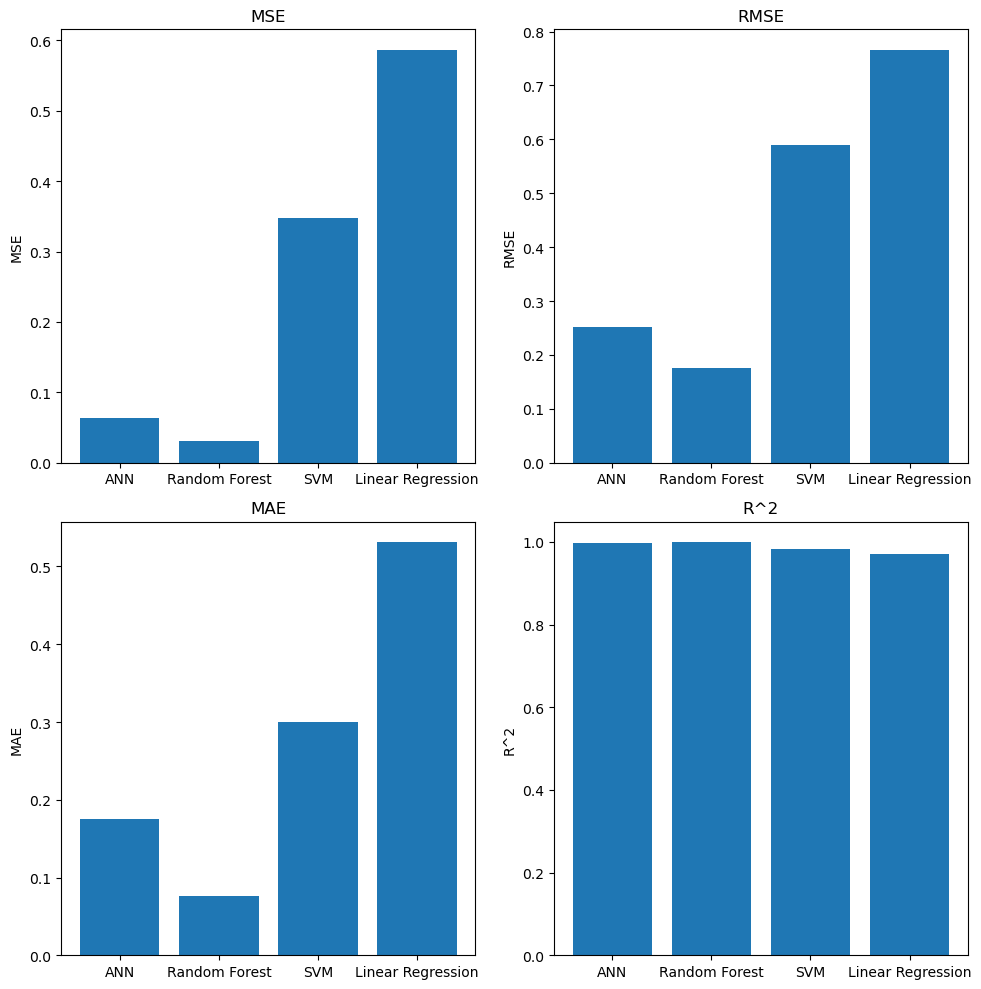

In [66]:
import matplotlib.pyplot as plt
import numpy as np

# Metrics for each model
metrics = {
    'ANN': metrics_ann,
    'Random Forest': metrics_rf,
    'SVM': metrics_svm,
    'Linear Regression': metrics_lr
}

# Metric names
metric_names = ['MSE', 'RMSE', 'MAE', 'R^2']

# Create a figure and a set of subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# Reshape the axes array
axs = np.ravel(axs)

# Plot a bar graph for each metric
for i, metric in enumerate(metric_names):
    axs[i].bar(metrics.keys(), [m[i] for m in metrics.values()])
    axs[i].set_title(metric)
    axs[i].set_ylabel(metric)

# Display the plot
plt.tight_layout()
plt.show()


In [85]:

import plotly.express as px
import pandas as pd

# Convert the metrics to a DataFrame
df_metrics = pd.DataFrame(metrics).T
df_metrics.columns = metric_names

# Melt the DataFrame to a long format
df_melted = df_metrics.reset_index().melt(id_vars='index', var_name='Metric', value_name='Value')

# Define a list of color palettes
color_palettes = ['Viridis', 'Rainbow','Plasma', 'Cividis']

# Create a bar plot for each metric
for i, metric in enumerate(metric_names):
    df_filtered = df_melted[df_melted['Metric'] == metric]
    fig = px.bar(df_filtered, x='index', y='Value', color='Value', title=metric,
                 labels={'index': 'Model', 'Value': metric}, height=400,
                 color_continuous_scale=color_palettes[i % len(color_palettes)])
    fig.show()



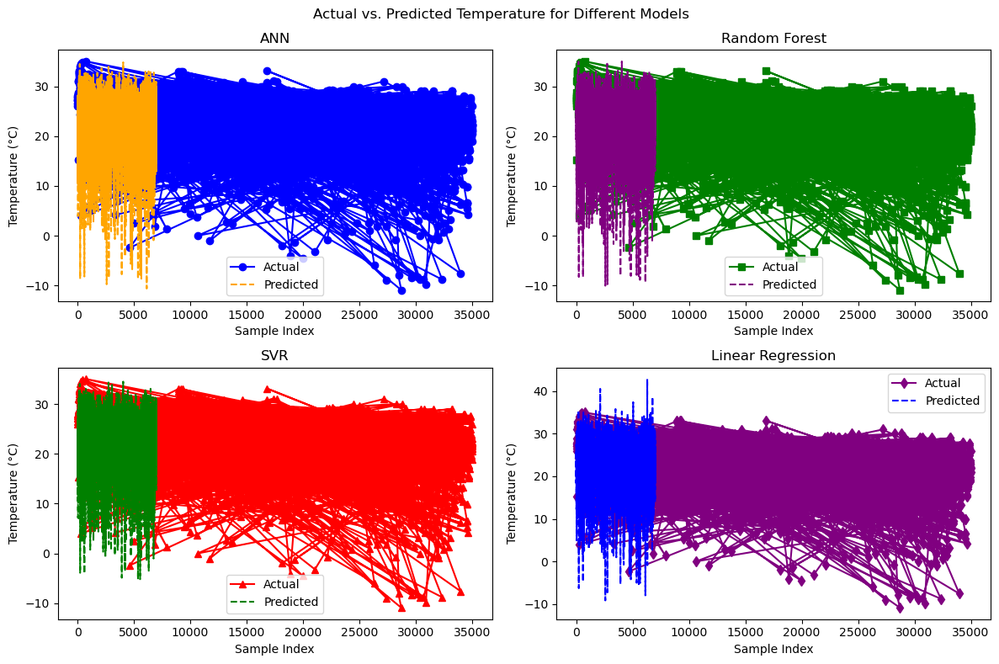

In [68]:
import matplotlib.pyplot as plt

# Create separate plots for each model
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Actual vs. Predicted Temperature for Different Models')

# Plot for ANN
axs[0, 0].plot(y_test, label='Actual', marker='o', linestyle='-', color='b')
axs[0, 0].plot(predictions_ann, label='Predicted', linestyle='--', color='orange')  # Different color for predictions
axs[0, 0].set_title('ANN')
axs[0, 0].set_xlabel('Sample Index')
axs[0, 0].set_ylabel('Temperature (°C)')
axs[0, 0].legend()

# Plot for Random Forest
axs[0, 1].plot(y_test_rf, label='Actual', marker='s', linestyle='-', color='g')
axs[0, 1].plot(predictions_rf, label='Predicted', linestyle='--', color='purple')  # Different color for predictions
axs[0, 1].set_title('Random Forest')
axs[0, 1].set_xlabel('Sample Index')
axs[0, 1].set_ylabel('Temperature (°C)')
axs[0, 1].legend()

# Plot for SVR
axs[1, 0].plot(y_test_svr, label='Actual', marker='^', linestyle='-', color='r')
axs[1, 0].plot(predictions_svr, label='Predicted', linestyle='--', color='green')  # Different color for predictions
axs[1, 0].set_title('SVR')
axs[1, 0].set_xlabel('Sample Index')
axs[1, 0].set_ylabel('Temperature (°C)')
axs[1, 0].legend()

# Plot for Linear Regression
axs[1, 1].plot(y_test_lr, label='Actual', marker='d', linestyle='-', color='purple')
axs[1, 1].plot(predictions_lr, label='Predicted', linestyle='--', color='blue')  # Different color for predictions
axs[1, 1].set_title('Linear Regression')
axs[1, 1].set_xlabel('Sample Index')
axs[1, 1].set_ylabel('Temperature (°C)')
axs[1, 1].legend()

# Adjust layout
plt.tight_layout()
plt.show()


NameError: name 'y_test_ann' is not defined

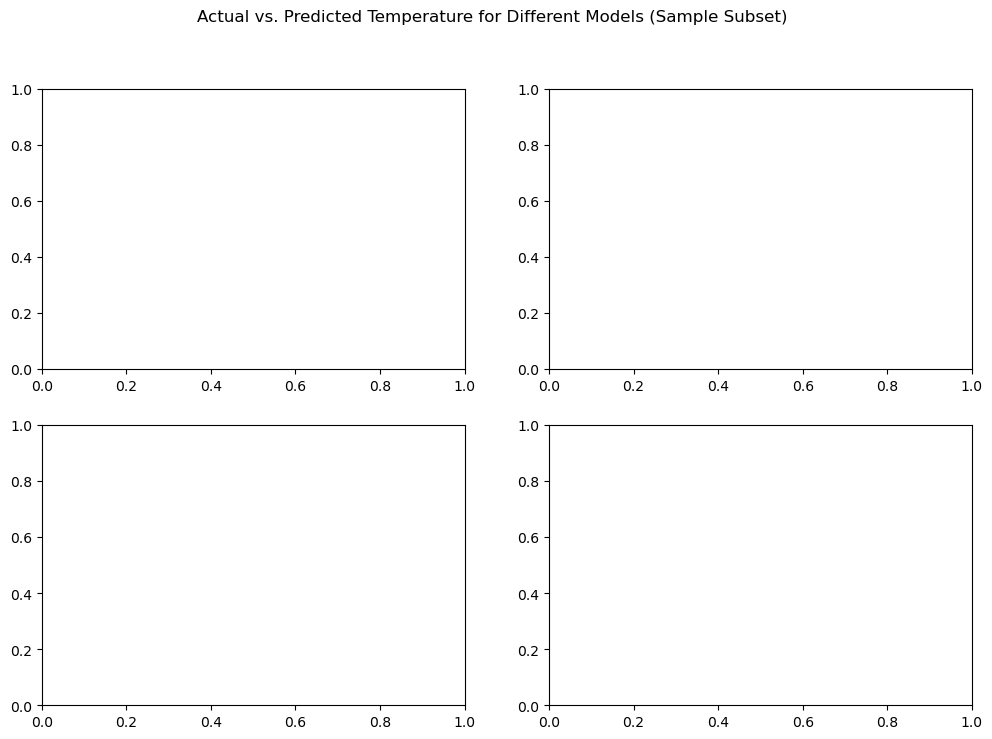

In [69]:
import matplotlib.pyplot as plt

# Create separate plots for each model
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Actual vs. Predicted Temperature for Different Models (Sample Subset)')

# Plot for ANN
axs[0, 0].plot(y_test_ann[:10], label='Actual', marker='o', linestyle='-', color='b')
axs[0, 0].plot(predictions_ann[:10], label='Predicted', linestyle='--', color='orange')
axs[0, 0].set_title('ANN')
axs[0, 0].set_xlabel('Sample Index')
axs[0, 0].set_ylabel('Temperature (°C)')
axs[0, 0].legend()

# Plot for Random Forest
axs[0, 1].plot(y_test_rf[:10], label='Actual', marker='s', linestyle='-', color='g')
axs[0, 1].plot(predictions_rf[:10], label='Predicted', linestyle='--', color='purple')
axs[0, 1].set_title('Random Forest')
axs[0, 1].set_xlabel('Sample Index')
axs[0, 1].set_ylabel('Temperature (°C)')
axs[0, 1].legend()

# Plot for SVR
axs[1, 0].plot(y_test_svr[:10], label='Actual', marker='^', linestyle='-', color='r')
axs[1, 0].plot(predictions_svr[:10], label='Predicted', linestyle='--', color='green')
axs[1, 0].set_title('SVR')
axs[1, 0].set_xlabel('Sample Index')
axs[1, 0].set_ylabel('Temperature (°C)')
axs[1, 0].legend()

# Plot for Linear Regression
axs[1, 1].plot(y_test_lr[:10], label='Actual', marker='d', linestyle='-', color='purple')
axs[1, 1].plot(predictions_lr[:10], label='Predicted', linestyle='--', color='blue')
axs[1, 1].set_title('Linear Regression')
axs[1, 1].set_xlabel('Sample Index')
axs[1, 1].set_ylabel('Temperature (°C)')
axs[1, 1].legend()

# Adjust layout
plt.tight_layout()
plt.show()


ValueError: x and y must have same first dimension, but have shapes (35014,) and (7003,)

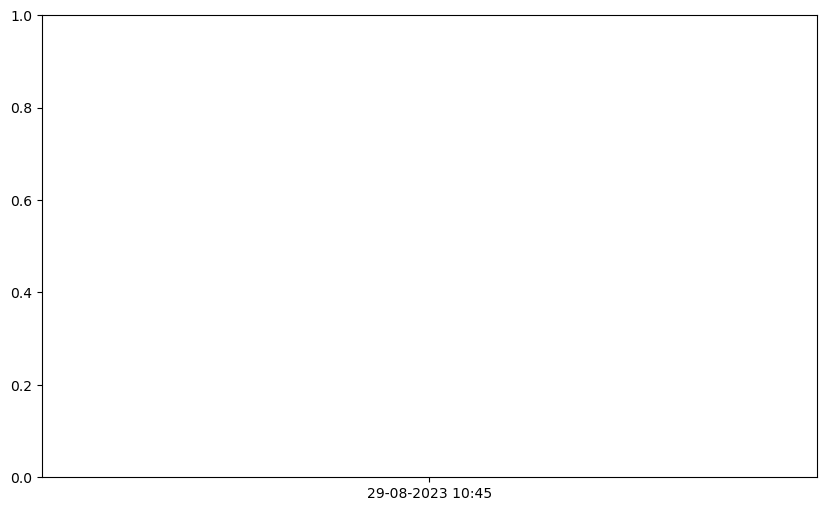

In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot actual values
ax.plot(w['last_updated'], y_test, label='Actual (ANN)', marker='o', linestyle='-', color='b')

# Plot predicted values
ax.plot(w['last_updated'], predictions_ann, label='Predicted (ANN)', linestyle='--', color='orange')

# Customize the plot
ax.set_xlabel('Date (last_updated)')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Actual vs. Predicted Temperature (ANN)')
ax.legend()

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()
